# Pengolahan Citra Digital

- Nama = Muhammad Rizky Anugrah
- NIM = 1306620089
- Kelas = Fisika - B
- Mata Kuliah = Pengolahan Citra Digital
- Dosen : Haris Suhendar, M.Si.

In [49]:
%matplotlib inline
from PIL import Image
from PIL import Image, ImageEnhance, ImageFilter
from skimage.io import imread, imshow, show
from skimage.feature import canny
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
from scipy import stats
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale, resize
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit
from scipy import fftpack
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import cv2 as cv
from scipy import signal
import numpy.fft as fp
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color

In [2]:
def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image)
    pylab.axis('off')
    
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    pylab.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    pylab.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    pylab.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    pylab.xlabel('Pixel Value', size=20), pylab.ylabel('Frequency', size=20)
    pylab.title(title, size=20)

## Load Data Gambar

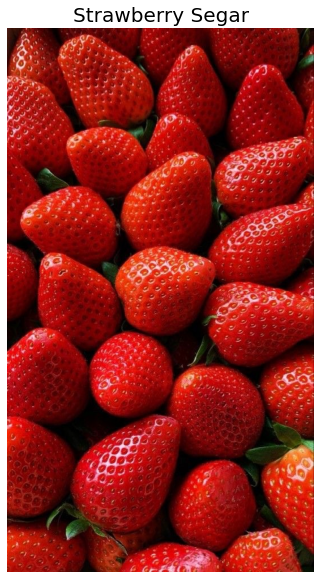

In [3]:
im1 = Image.open("Strawberry Segar.jpeg")
pylab.figure(figsize=(15,10))
plot_image(im1, 'Strawberry Segar')

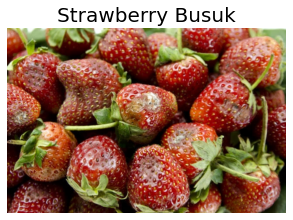

In [4]:
im2 = Image.open("Strawberry Busuk.jpeg")
pylab.figure(figsize=(5,5))
plot_image(im2, 'Strawberry Busuk')

## Histogram Masing-Masing Gambar

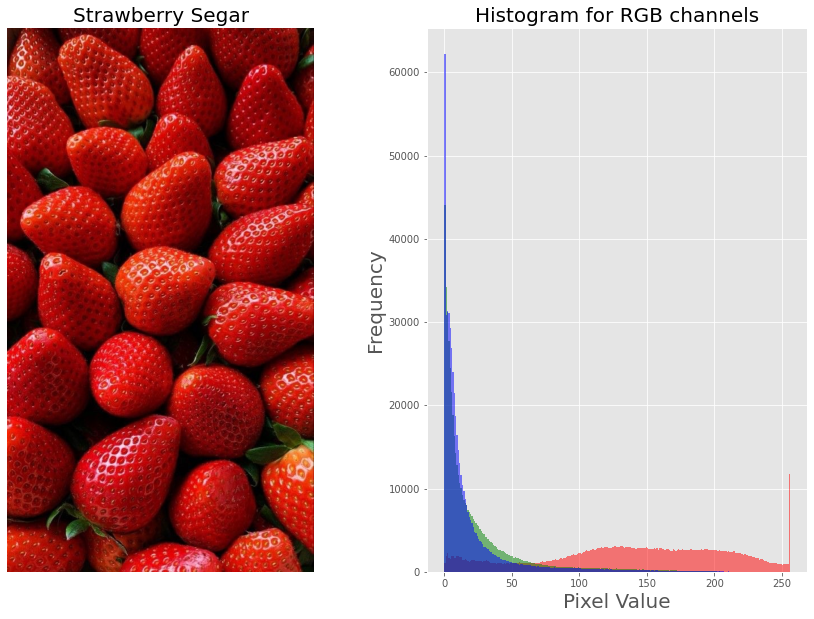

In [5]:
im_r1, im_g1, im_b1 = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,10))
pylab.subplot(121), plot_image(im1, 'Strawberry Segar')
pylab.subplot(122), plot_hist(im_r1, im_g1, im_b1,'Histogram for RGB channels')
pylab.show()

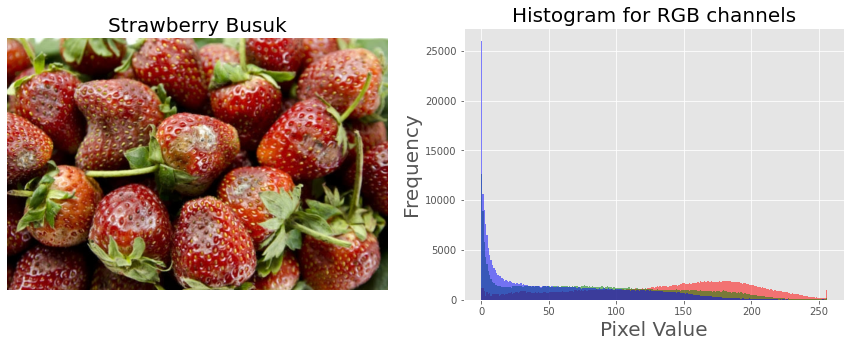

In [6]:
im_r2, im_g2, im_b2 = im2.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im2, 'Strawberry Busuk')
pylab.subplot(122), plot_hist(im_r2, im_g2, im_b2,'Histogram for RGB channels')
pylab.show()

## Histogram Masing-Masing Warna

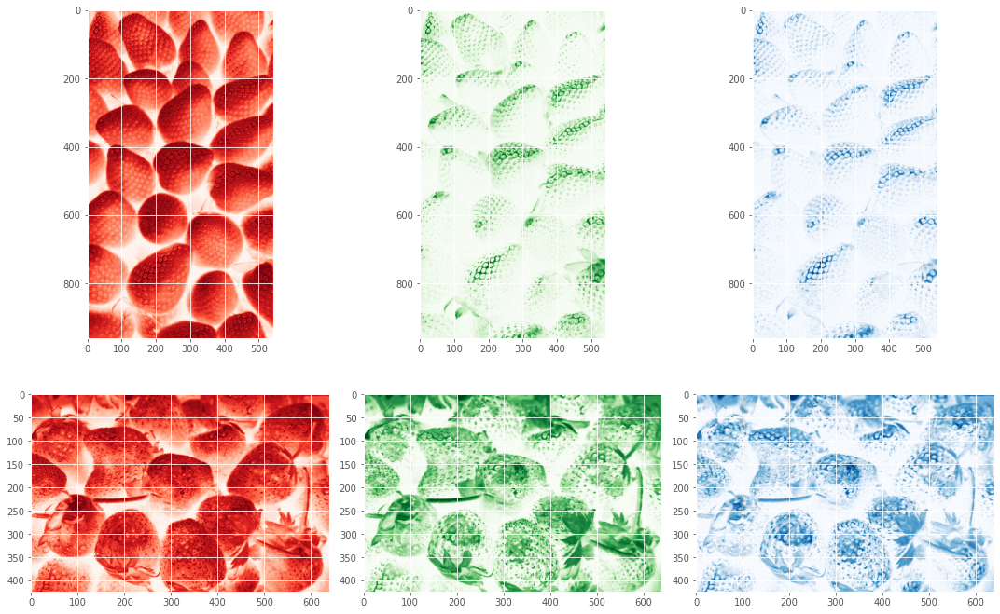

In [7]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
plt.imshow(im_r1, cmap=plt.cm.Reds)
plt.subplot(2,3,2)
plt.imshow(im_g1, cmap=plt.cm.Greens)
plt.subplot(2,3,3)
plt.imshow(im_b1, cmap=plt.cm.Blues)
plt.subplot(2,3,4)
plt.imshow(im_r2, cmap=plt.cm.Reds)
plt.subplot(2,3,5)
plt.imshow(im_g2, cmap=plt.cm.Greens)
plt.subplot(2,3,6)
plt.imshow(im_b2, cmap=plt.cm.Blues)
plt.tight_layout()
plt.show()

## Imread Image

In [8]:
image1 = imread('Strawberry Segar.jpeg')
image2 = imread('Strawberry Busuk.jpeg')

In [9]:
im_1 = rgb2gray(image1)
im_2 = rgb2gray(image2)

## Kernel Blur Box, Laplace Edge, Edge Detect

In [10]:
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
gauss_blur = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])/ 16

## Correlation And Convolution

In [11]:
im_cor1 = signal.correlate2d(im_1, edge_laplace_kernel)
im_conv1 = signal.convolve2d(im_1, edge_laplace_kernel)
im_cor2 = signal.correlate2d(im_2, edge_laplace_kernel)
im_conv2 = signal.convolve2d(im_2, edge_laplace_kernel)

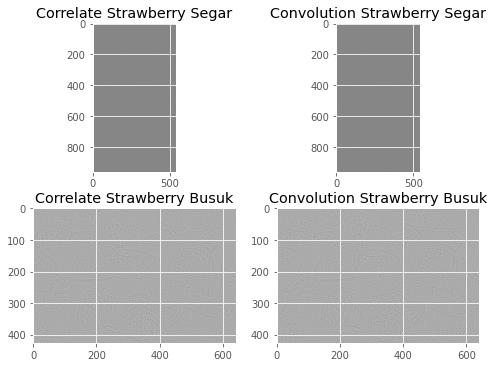

In [12]:
plt.figure(figsize=(8,6))
plt.subplot(2,2,1)
plt.title('Correlate Strawberry Segar')
plt.imshow(im_cor1, cmap='gray')
plt.subplot(2,2,2)
plt.title('Convolution Strawberry Segar')
plt.imshow(im_conv1, cmap='gray')
plt.subplot(2,2,3)
plt.title('Correlate Strawberry Busuk')
plt.imshow(im_cor2, cmap='gray')
plt.subplot(2,2,4)
plt.title('Convolution Strawberry Busuk')
plt.imshow(im_conv2, cmap='gray')

## Convolution Manual dan Convolution FFT

## Convolution Manual

In [13]:
def convolve2D(image, kernel, padding=0, strides=1):
    # Cross Correlation
    kernel = np.flipud(np.fliplr(kernel))

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
        print(imagePadded)
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        output[x, y] = (kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum()
                except:
                    break

    return output

In [14]:
a = 0
b = 1
im_man_box1 = convolve2D(im_1, blur_box_kernel, padding = a, strides = b)
im_man_lap1 = convolve2D(im_1, edge_laplace_kernel, padding = a, strides = b)
im_man_gauss1 = convolve2D(im_1, gauss_blur, padding = a, strides = b)

im_man_box2 = convolve2D(im_2, blur_box_kernel, padding = a, strides = b)
im_man_lap2 = convolve2D(im_2, edge_laplace_kernel, padding = a, strides = b)
im_man_gauss2 = convolve2D(im_2, gauss_blur, padding = a, strides = b)

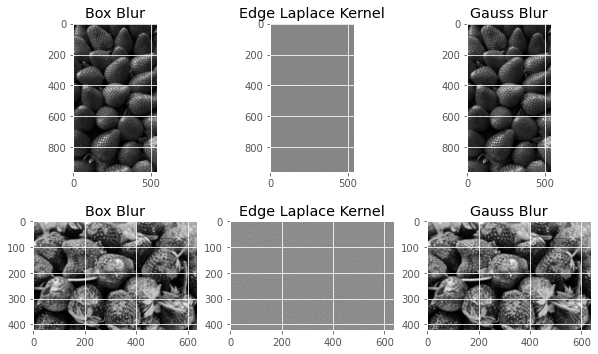

In [15]:
plt.figure(figsize=(10,6))
plt.subplot(2,3,1)
plt.title('Box Blur')
plt.imshow(im_man_box1, cmap='gray')
plt.subplot(2,3,2)
plt.title('Edge Laplace Kernel')
plt.imshow(im_man_lap1, cmap='gray')
plt.subplot(2,3,3)
plt.title('Gauss Blur')
plt.imshow(im_man_gauss1, cmap='gray')
plt.subplot(2,3,4)
plt.title('Box Blur')
plt.imshow(im_man_box2, cmap='gray')
plt.subplot(2,3,5)
plt.title('Edge Laplace Kernel')
plt.imshow(im_man_lap2, cmap='gray')
plt.subplot(2,3,6)
plt.title('Gauss Blur')
plt.imshow(im_man_gauss2, cmap='gray')

## Convolution FFT

In [16]:
def conv_fft(x,y):
    # x = image, y = kernel
    s1 = np.array(x.shape)
    s2 = np.array(y.shape)

    size = s1 + s2 - 1

    fsize = 2 ** np.ceil(np.log2(size)).astype(int)
    fslice = tuple([slice(0, int(sz)) for sz in size])

    new_x = np.fft.fft2(x , fsize)
    new_y = np.fft.fft2(y , fsize)
    
    result = np.fft.ifft2(new_x*new_y)[fslice].copy()
    
    return np.absolute(result)

In [17]:
im_fft_box1 = conv_fft(im_1, blur_box_kernel)
im_fft_lap1 = conv_fft(im_1, edge_laplace_kernel)
im_fft_gauss1 = conv_fft(im_1, gauss_blur)

im_fft_box2 = conv_fft(im_2, blur_box_kernel)
im_fft_lap2 = conv_fft(im_2, edge_laplace_kernel)
im_fft_gauss2 = conv_fft(im_2, gauss_blur)

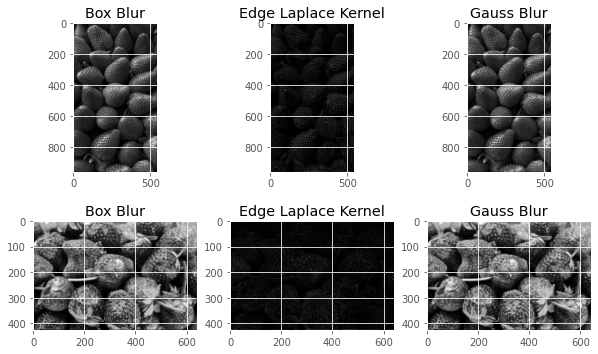

In [18]:
plt.figure(figsize=(10,6))
plt.subplot(2,3,1)
plt.title('Box Blur')
plt.imshow(im_fft_box1, cmap='gray')
plt.subplot(2,3,2)
plt.title('Edge Laplace Kernel')
plt.imshow(im_fft_lap1, cmap='gray')
plt.subplot(2,3,3)
plt.title('Gauss Blur')
plt.imshow(im_fft_gauss1, cmap='gray')
plt.subplot(2,3,4)
plt.title('Box Blur')
plt.imshow(im_fft_box2, cmap='gray')
plt.subplot(2,3,5)
plt.title('Edge Laplace Kernel')
plt.imshow(im_fft_lap2, cmap='gray')
plt.subplot(2,3,6)
plt.title('Gauss Blur')
plt.imshow(im_fft_gauss2, cmap='gray')

## Transformasi FFT

In [19]:
freq1 = fp.fft2(im_1)
im1_ = fp.ifft2(freq1).real
freq2 = fp.fft2(im_2)
im2_ = fp.ifft2(freq2).real

## Plot Original Image, FFT Spectrum Magnitude, FFT Phase dan Reconstructed Image

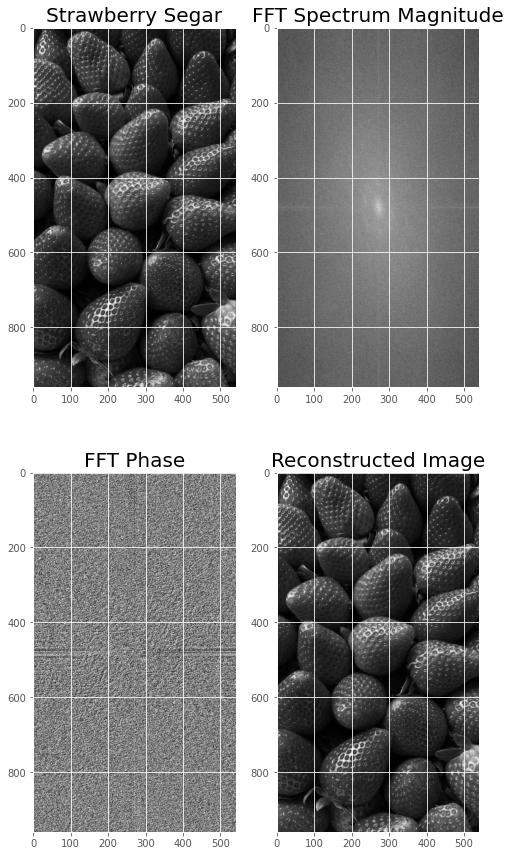

In [20]:
pylab.figure(figsize=(8,15))
pylab.subplot(2,2,1) 
pylab.imshow(im_1, cmap='gray') 
pylab.title('Strawberry Segar', size=20)
                                                                     
pylab.subplot(2,2,2)
pylab.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(freq1))), cmap='gray')
pylab.title('FFT Spectrum Magnitude', size=20)

pylab.subplot(2,2,3) 
pylab.imshow(np.angle(fp.fftshift(freq1)),cmap='gray')
pylab.title('FFT Phase', size=20)

pylab.subplot(2,2,4)
pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

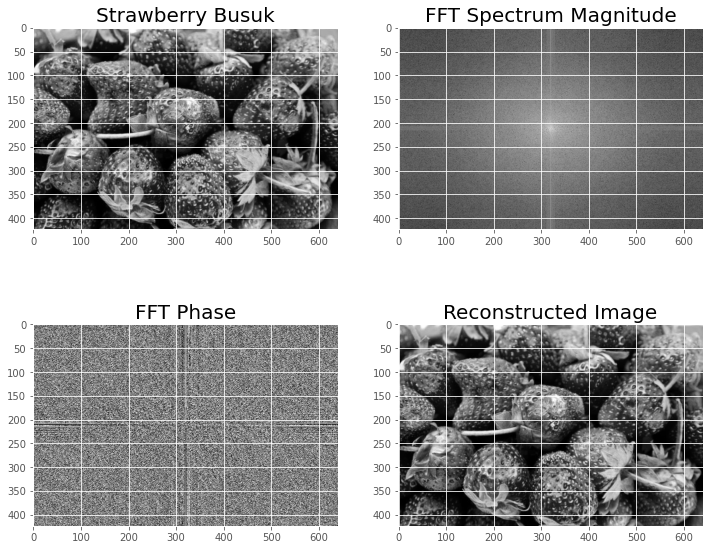

In [21]:
pylab.figure(figsize=(12,10))
pylab.subplot(2,2,1) 
pylab.imshow(im_2, cmap='gray') 
pylab.title('Strawberry Busuk', size=20)
                                                                     
pylab.subplot(2,2,2)
pylab.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(freq2))), cmap='gray')
pylab.title('FFT Spectrum Magnitude', size=20)

pylab.subplot(2,2,3) 
pylab.imshow(np.angle(fp.fftshift(freq2)),cmap='gray')
pylab.title('FFT Phase', size=20)

pylab.subplot(2,2,4)
pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

## Blurring FFT Image

In [22]:
def sigma_filter(sigma, image):
    ncols, nrows = image.shape[0], image.shape[1]
    sigmax, sigmay = sigma, sigma
    cy, cx = nrows/2, ncols/2
    x = np.linspace(0, nrows, nrows)
    y = np.linspace(0, ncols, ncols)
    X, Y = np.meshgrid(x, y)
    gmask = np.exp(-(((X-cx)/sigmax)**2 + ((Y-cy)/sigmay)**2))
    return gmask

In [23]:
# FFT 
ftimage1 = fp.fft2(im_1)
ftimage1 = fp.fftshift(ftimage1)

# Frequency + Mask
ftimagep1 = ftimage1 * sigma_filter(25,ftimage1)

# Reconstructed Image with Filter
imagep1 = fp.ifft2(ftimagep1)

Text(0.5, 1.0, 'Reconstructed Image with Gauss')

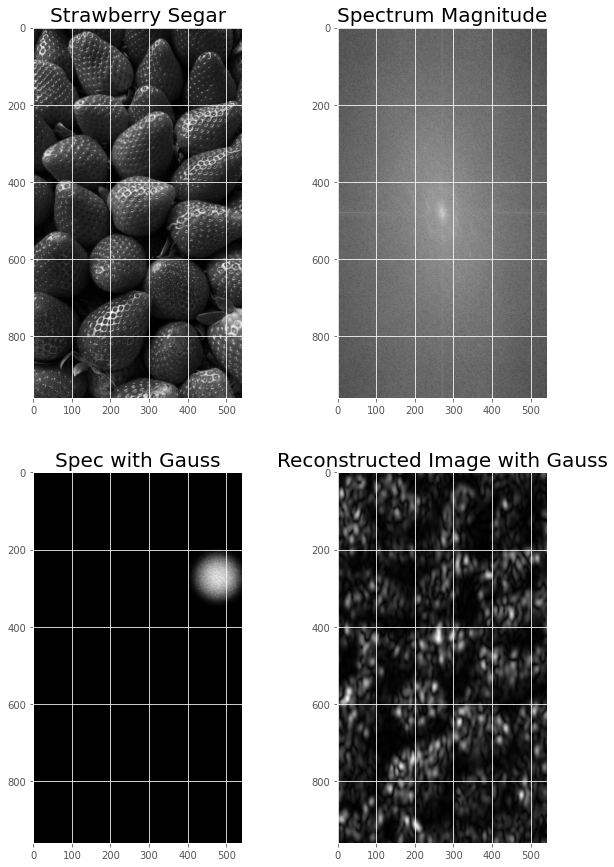

In [24]:
pylab.figure(figsize=(10,15))
pylab.subplot(2,2,1) 
pylab.imshow(im_1, cmap='gray') 
pylab.title('Strawberry Segar', size=20)
                                                                     
pylab.subplot(2,2,2)
pylab.imshow(20*np.log10( 0.01 + np.abs(ftimage1)), cmap='gray')
pylab.title('Spectrum Magnitude', size=20)

pylab.subplot(2,2,3) 
pylab.imshow(20*np.log10( 0.01 + np.abs(ftimagep1)), cmap='gray')
pylab.title('Spec with Gauss', size=20)

pylab.subplot(2,2,4)
pylab.imshow(np.abs(imagep1), cmap='gray')
pylab.title('Reconstructed Image with Gauss', size=20)

In [25]:
# FFT 
ftimage2 = fp.fft2(im_2)
ftimage2 = fp.fftshift(ftimage2)

# Frequency + Mask
ftimagep2 = ftimage2 * sigma_filter(25,ftimage2)

# Reconstructed Image with Filter
imagep2 = fp.ifft2(ftimagep2)

Text(0.5, 1.0, 'Reconstructed Image with Gauss')

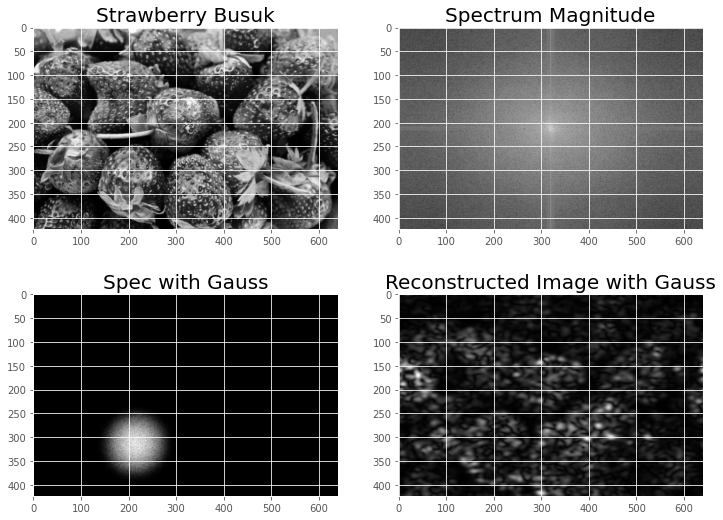

In [26]:
pylab.figure(figsize=(12,9))
pylab.subplot(2,2,1) 
pylab.imshow(im_2, cmap='gray') 
pylab.title('Strawberry Busuk', size=20)
                                                                     
pylab.subplot(2,2,2)
pylab.imshow(20*np.log10( 0.01 + np.abs(ftimage2)), cmap='gray')
pylab.title('Spectrum Magnitude', size=20)

pylab.subplot(2,2,3) 
pylab.imshow(20*np.log10( 0.01 + np.abs(ftimagep2)), cmap='gray')
pylab.title('Spec with Gauss', size=20)

pylab.subplot(2,2,4)
pylab.imshow(np.abs(imagep2), cmap='gray')
pylab.title('Reconstructed Image with Gauss', size=20)

In [27]:
def Gauss_grid(image,multi = 1,GRID=[5,5]): #image must be grayscale
    ftimage = fp.fft2(image)
    ftimage = fp.fftshift(ftimage)
    n_rows, n_cols = GRID[0], GRID[1]
    pylab.figure(figsize=(15,15))
    for i in range(1,26):
        num = i*multi
        filter = sigma_filter(num,ftimage)
        ftimagep = ftimage * filter
        imagep = fp.ifft2(ftimagep)

        pylab.subplot(n_rows, n_cols, i)
        pylab.imshow(np.abs(imagep), cmap='gray')
        pylab.title('Gauss, sigma = {}'.format(num))
        pylab.axis('off')

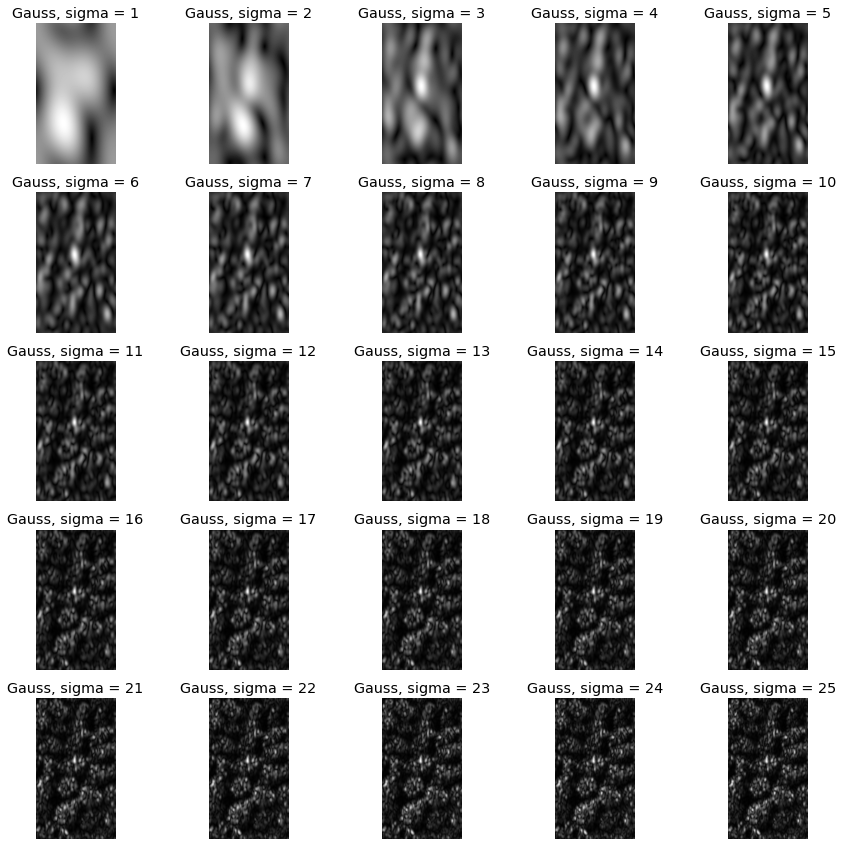

In [28]:
Gauss_grid(im_1)

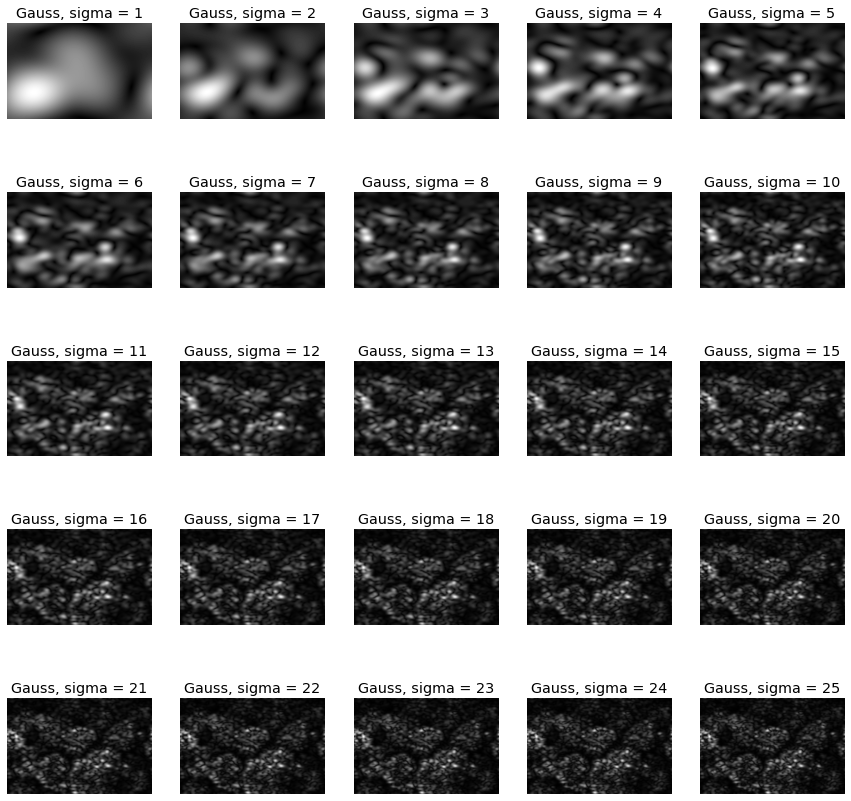

In [29]:
Gauss_grid(im_2)

## Threshold

In [30]:
def thres_less(image,multi = 1,GRID=[5,5]): #image must be grayscale
    ftimage = fp.fft2(image)
    n_rows, n_cols = GRID[0], GRID[1]
    pylab.figure(figsize=(15,15))
    total = n_rows*n_cols + 1
    for thres in range(1,total):
        row, col = ftimage.shape[0], ftimage.shape[1]
        temp = np.zeros((row,col), dtype=complex)
        poin = thres*multi
        for i in range(row):
            for j in range(col):
                if np.absolute(ftimage[i][j]) < poin:
                    num = 0
                else:
                    num = ftimage[i][j]
                temp[i][j] += num 
        imagep = fp.ifft2(temp)

        pylab.subplot(n_rows, n_cols, thres)
        pylab.imshow(np.abs(imagep), cmap='gray')
        pylab.title('x < {}'.format(poin))
        pylab.axis('off')

In [31]:
def thres_more(image,multi = 1,GRID=[5,5]): #image must be grayscale
    ftimage = fp.fft2(image)
    n_rows, n_cols = GRID[0], GRID[1]
    pylab.figure(figsize=(15,15))
    total = n_rows*n_cols + 1
    for thres in range(1,total):
        row, col = ftimage.shape[0], ftimage.shape[1]
        temp = np.zeros((row,col), dtype=complex)
        poin = thres*multi
        for i in range(row):
            for j in range(col):
                if np.absolute(ftimage[i][j]) > poin:
                    num = 0
                else:
                    num = ftimage[i][j]
                temp[i][j] += num 
        imagep = fp.ifft2(temp)

        pylab.subplot(n_rows, n_cols, thres)
        pylab.imshow(np.abs(imagep), cmap='gray')
        pylab.title('x > {}'.format(poin))
        pylab.axis('off')

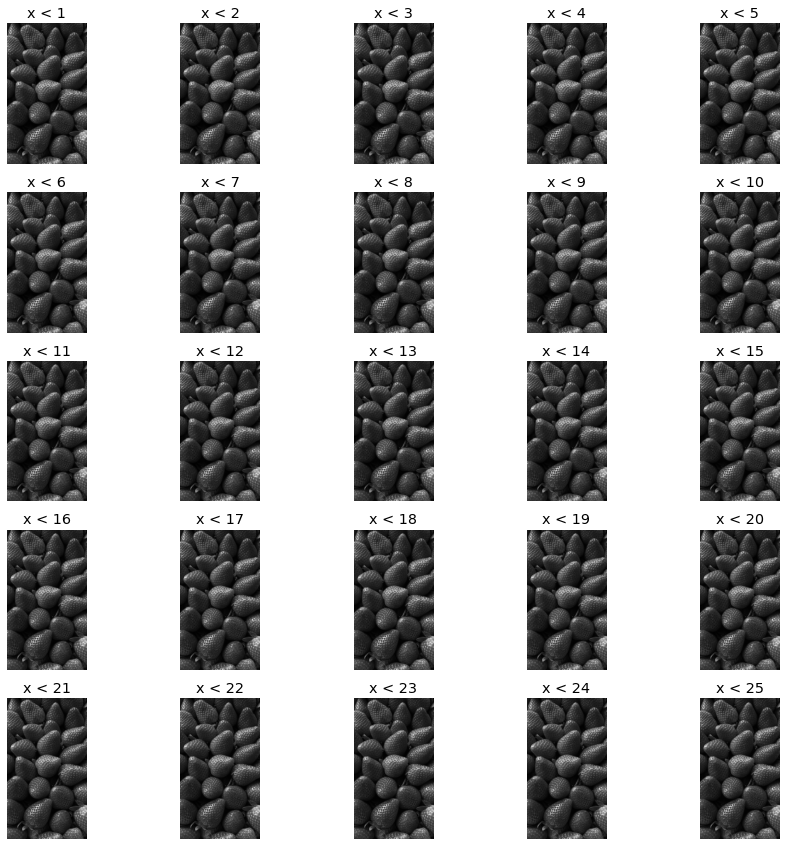

In [32]:
thres_less(im_1)

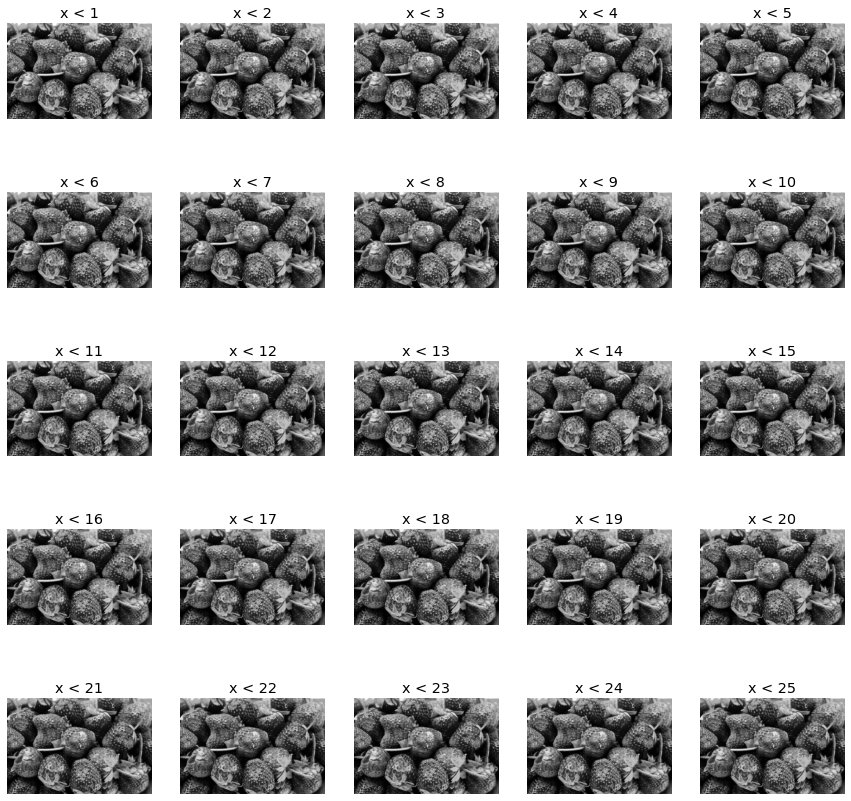

In [33]:
thres_less(im_2)

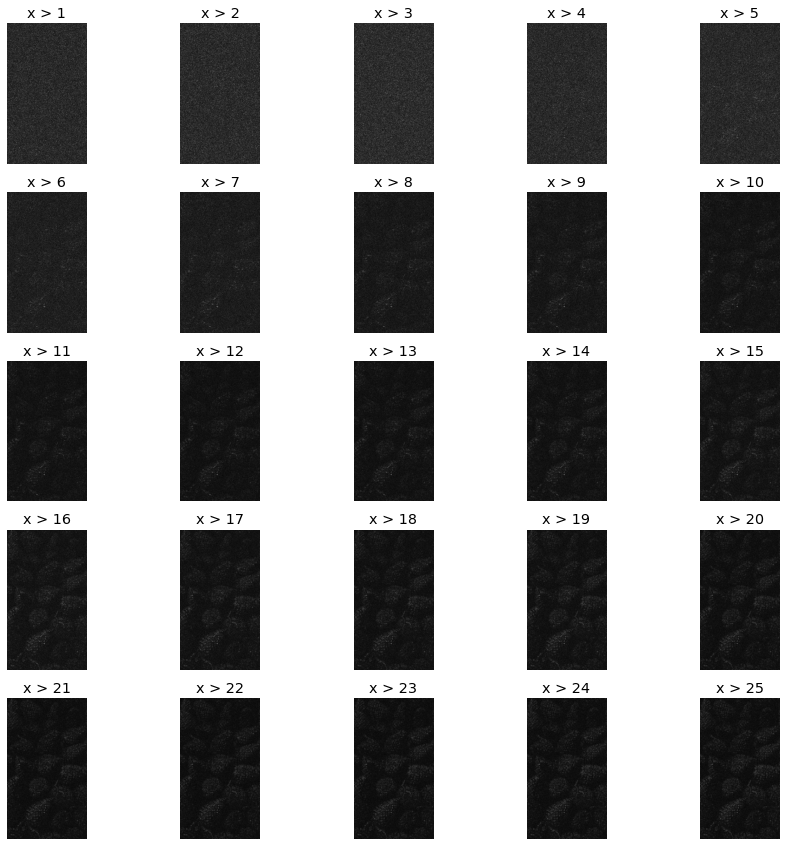

In [34]:
thres_more(im_1)

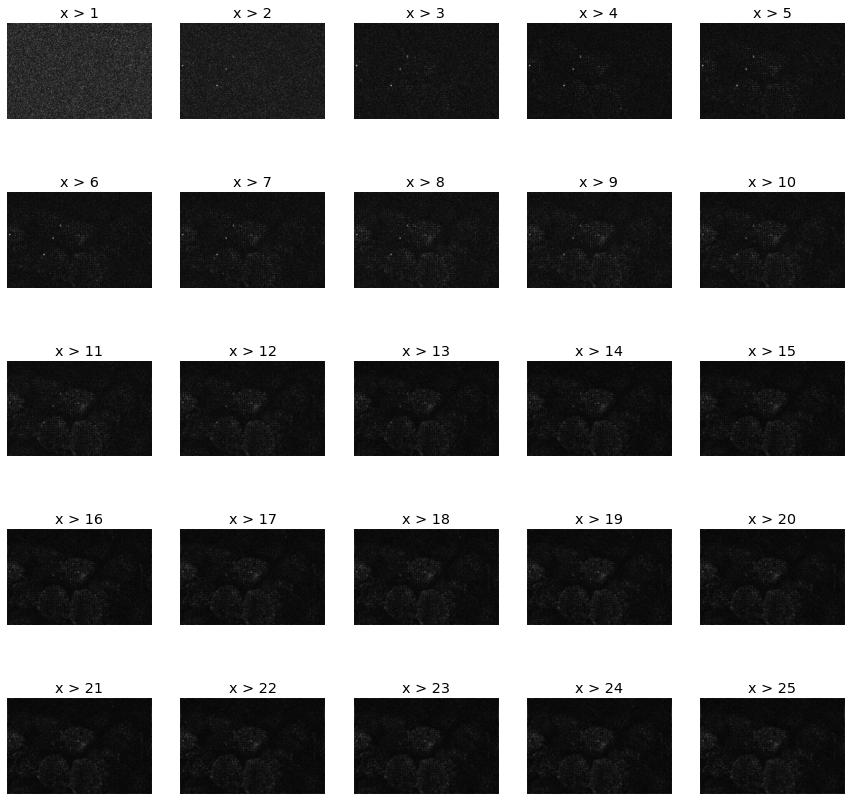

In [35]:
thres_more(im_2)

## Log Transform

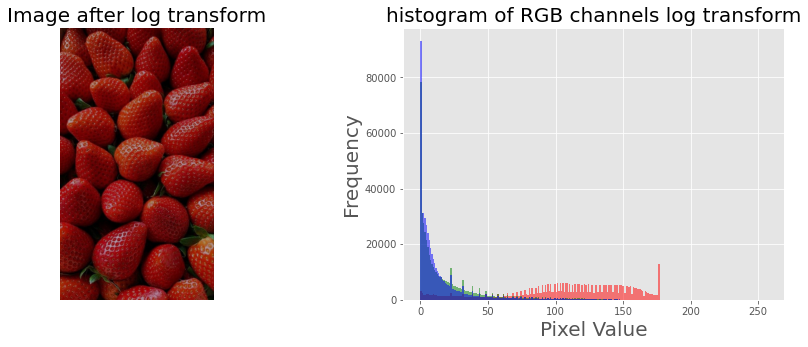

In [36]:
im_log1 = im1.point(lambda i: 255*np.log(1+i/255))
im_r_1, im_g_1, im_b_1 = im_log1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im_log1, 'Image after log transform')
pylab.subplot(122), plot_hist(im_r_1, im_g_1, im_b_1, 'histogram of RGB channels log transform')
pylab.show()

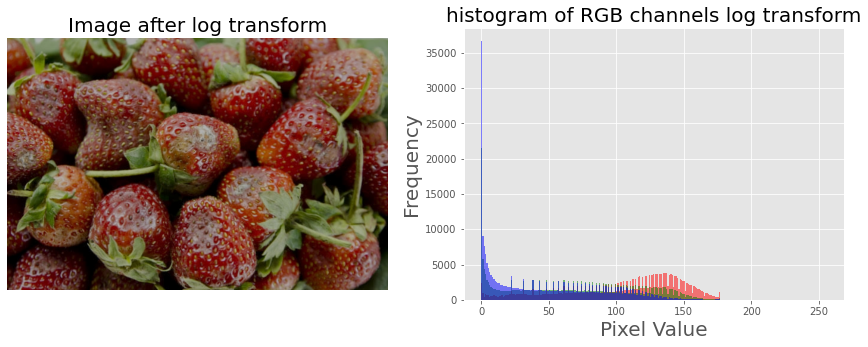

In [37]:
im_log2 = im2.point(lambda i: 255*np.log(1+i/255))
im_r_2, im_g_2, im_b_2 = im_log2.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im_log2, 'Image after log transform')
pylab.subplot(122), plot_hist(im_r_2, im_g_2, im_b_2, 'histogram of RGB channels log transform')
pylab.show()

## Power-Law Transform

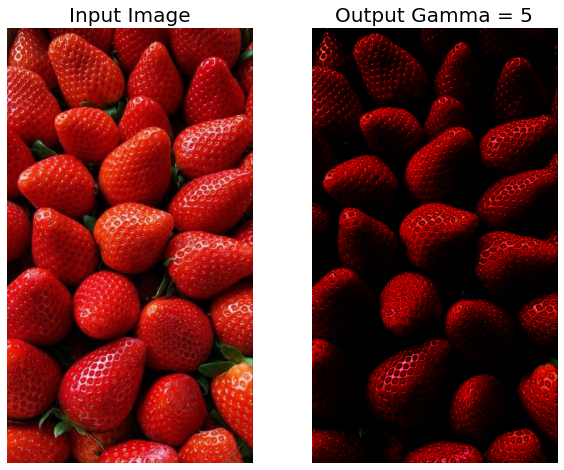

In [38]:
im_lt1 = img_as_float(imread('Strawberry Segar.jpeg'))
gamma1 = 5
imlt1 = im_lt1**gamma1
pylab.style.use('ggplot')
pylab.figure(figsize=(10,8))
pylab.subplot(121), plot_image(im_lt1,'Input Image')
pylab.subplot(122), plot_image(imlt1,'Output Gamma = 5')
pylab.show()

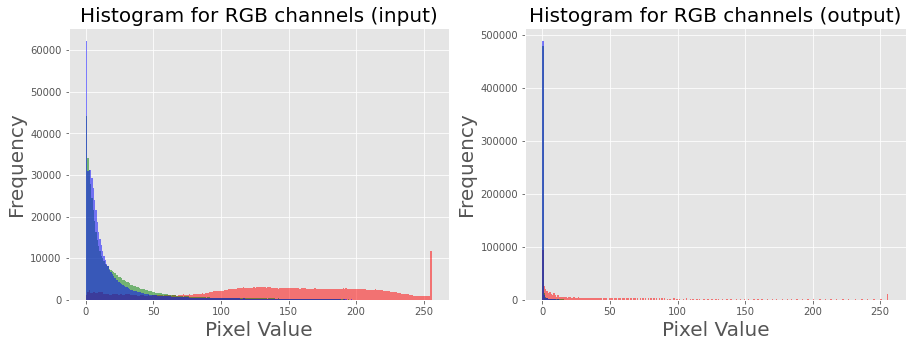

In [39]:
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_hist(im_lt1[...,0], im_lt1[...,1], im_lt1[...,2], 'Histogram for RGB channels (input)')
pylab.subplot(122), plot_hist(imlt1[...,0], imlt1[...,1], imlt1[...,2], 'Histogram for RGB channels (output)')
pylab.show()

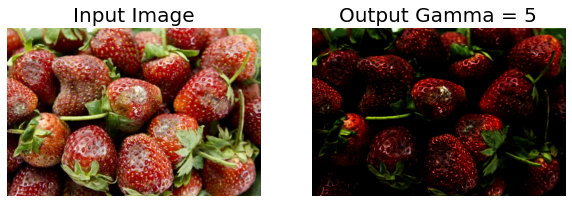

In [40]:
im_lt2 = img_as_float(imread('Strawberry Busuk.jpeg'))
gamma2 = 5
imlt2 = im_lt2**gamma2
pylab.style.use('ggplot')
pylab.figure(figsize=(10,8))
pylab.subplot(121), plot_image(im_lt2,'Input Image')
pylab.subplot(122), plot_image(imlt2,'Output Gamma = 5')
pylab.show()

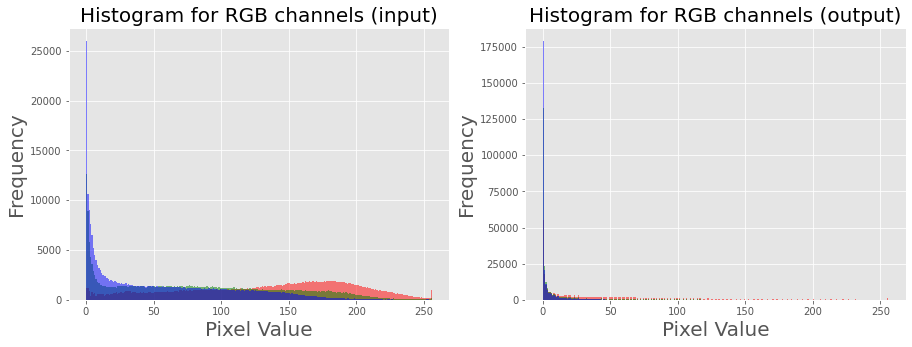

In [41]:
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_hist(im_lt2[...,0], im_lt2[...,1], im_lt2[...,2], 'Histogram for RGB channels (input)')
pylab.subplot(122), plot_hist(imlt2[...,0], imlt2[...,1], imlt2[...,2], 'Histogram for RGB channels (output)')
pylab.show()

## Using PIL as a Point Operation

In [42]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) #piece-wise linear function

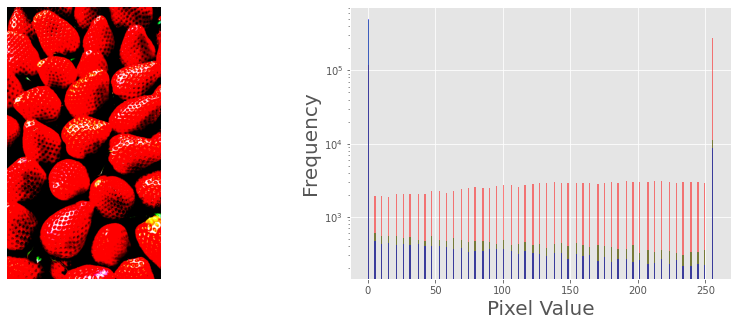

In [43]:
im = Image.open('Strawberry Segar.jpeg')
im_r, im_g, im_b = im.split()
im1 = im.point(contrast)
im_r, im_g, im_b = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im1)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.yscale('log',base=10)
pylab.show()

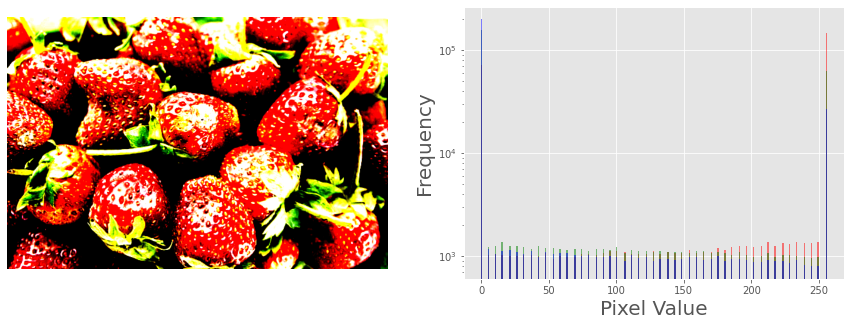

In [44]:
im = Image.open('Strawberry Busuk.jpeg')
im_r, im_g, im_b = im.split()
im1 = im.point(contrast)
im_r, im_g, im_b = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im1)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.yscale('log',base=10)
pylab.show()

## Using PIL ImageEnhance Module

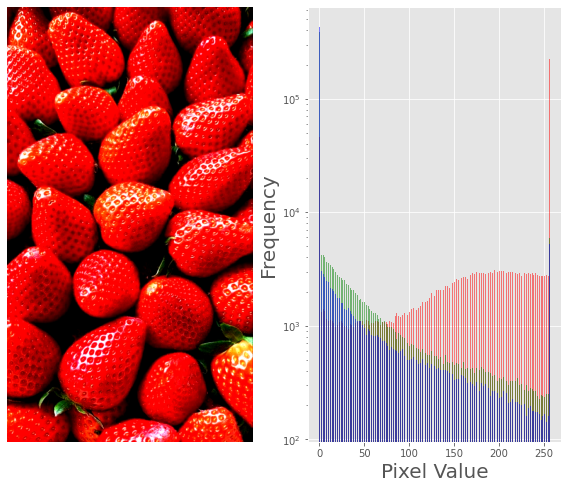

In [45]:
im = Image.open('Strawberry Segar.jpeg')
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8),
(im.height, im.width, 3))
pylab.style.use('ggplot')
pylab.figure(figsize=(10,8))
pylab.subplot(121), plot_image(im1)
pylab.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2]),
pylab.yscale('log',base=10)
pylab.show()

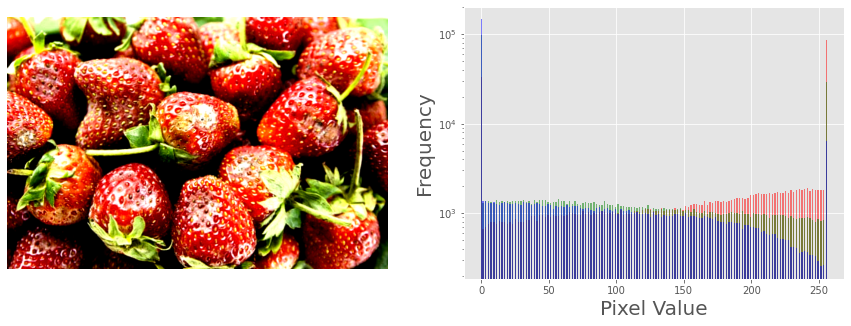

In [46]:
im = Image.open('Strawberry Busuk.jpeg')
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8),
(im.height, im.width, 3))
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im1)
pylab.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2]),
pylab.yscale('log',base=10)
pylab.show()

## Canny Edge Detector

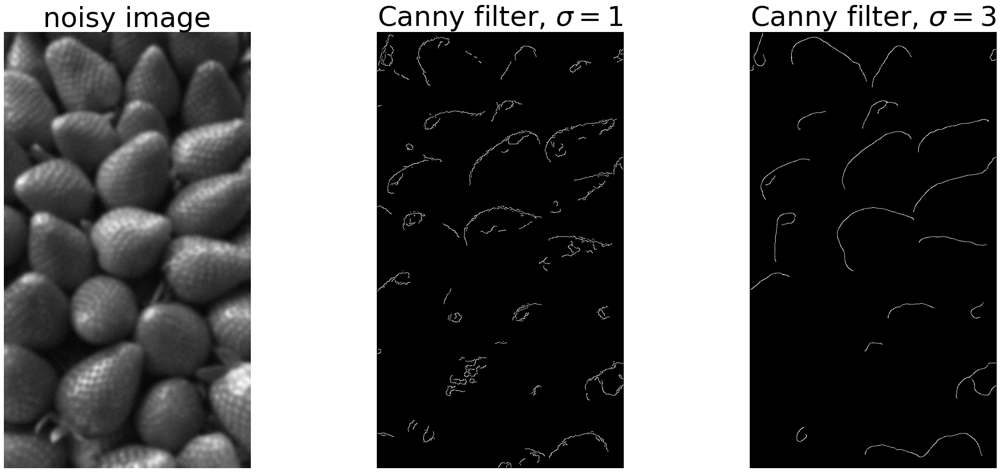

In [47]:
im = rgb2gray(imread('Strawberry Segar.jpeg'))
im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = canny(im)
edges2 = canny(im, sigma=3)
fig, (axes1, axes2, axes3) = pylab.subplots(nrows=1, ncols=3, figsize=(30,
12), sharex=True, sharey=True)
axes1.imshow(im, cmap=pylab.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=50)
axes2.imshow(edges1, cmap=pylab.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=50)
axes3.imshow(edges2, cmap=pylab.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=50)
fig.tight_layout()
pylab.show()

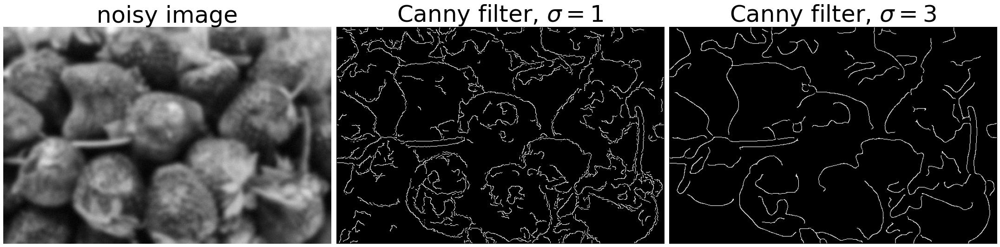

In [48]:
im = rgb2gray(imread('Strawberry Busuk.jpeg'))
im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = canny(im)
edges2 = canny(im, sigma=3)
fig, (axes1, axes2, axes3) = pylab.subplots(nrows=1, ncols=3, figsize=(30,
12), sharex=True, sharey=True)
axes1.imshow(im, cmap=pylab.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=50)
axes2.imshow(edges1, cmap=pylab.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=50)
axes3.imshow(edges2, cmap=pylab.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=50)
fig.tight_layout()
pylab.show()